<a href="https://colab.research.google.com/github/fishitmo/Thesis-Work/blob/main/Comparison_of_different_Optimization_Methods_Neural_Network_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.lines import Line2D
from IPython.display import Image

In [ ]:
def f(theta):
  x = theta[0]
  y = theta[1]
  return x**2 - y**2
  # #return x**4 + 2*x**3 + y**2 - 1
  # return x**3 - 3*x*y**2

def grad_f(theta):
    returnValue = np.array([0.,0.])
    x = theta[0]
    y = theta[1]
    returnValue[0] += 2*x
    returnValue[1] += - 2*y
    # # returnValue[0] += 4*x**3 + 6*x**2
    # # returnValue[1] += 2*y
    # returnValue[0] += 3*x**2 - 3*y**2
    # returnValue[1] += -6*x*y
    return returnValue

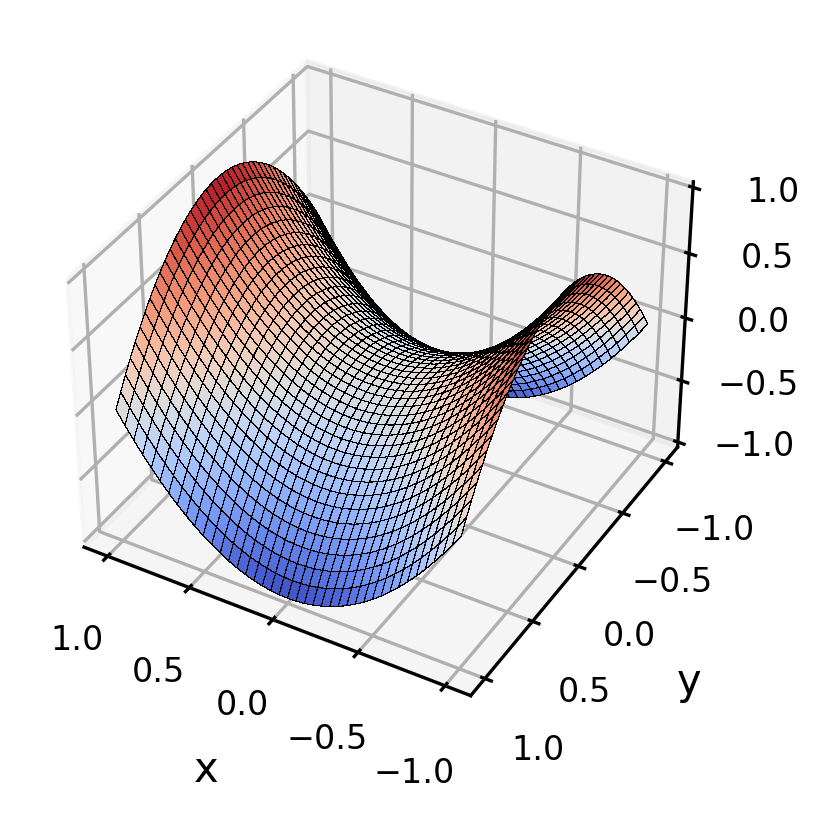

In [ ]:
fig1 = plt.figure(figsize = (4,3), dpi = 300)
ax1 = fig1.add_subplot(111, projection='3d')

plot_args = {'rstride': 2, 'cstride': 2, 'cmap':"coolwarm",
             'linewidth': 0.01, 'antialiased': False,
             'vmin': -1, 'vmax': 1, 'edgecolors':'k'}

x, y = np.mgrid[-1:1:81j, -1:1:81j]

ax1.plot_surface(x, y, f([x,y]), **plot_args)
ax1.view_init(azim= 120, elev= 37)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.tick_params(labelsize= 8)

In [ ]:
def gradient_descent(x_init, y_init, step_size, n_iters, momentum = 0):
  eta = step_size
  mu = momentum


  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )
  v_t = np.array([0,0])
  for k in range (1, n_iters):
      v_t = mu*v_t - eta *grad_f(theta[k-1])
      theta[k] = theta[k-1] + v_t
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

In [ ]:
def NAG(x_init, y_init, step_size, n_iters, momentum = 0.9):
  eta = step_size
  mu = momentum


  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )
  v_t = np.array([0,0])
  for k in range (1, n_iters):
      v_t = mu*v_t - eta *grad_f(theta[k-1] + mu * v_t)
      theta[k] = theta[k-1] + v_t
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

In [ ]:
def Adagrad(x_init, y_init, step_size, n_iters):
  eta = step_size
  G_t = 0
  eps = 1e-8


  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )
  for k in range (1, n_iters):
      g_t = grad_f(theta[k-1])
      G_t += g_t**2
      theta[k] = theta[k-1] - eta * g_t / (np.sqrt(G_t) + eps)
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

In [ ]:
def RMSProp(x_init, y_init, step_size, n_iters, decay):
  eta = step_size
  eps = 1e-8
  MSQ = 0

  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )
  for k in range (1, n_iters):

      g_t = grad_f(theta[k-1])
      MSQ = decay * MSQ + (1 - decay) * g_t**2
      theta[k] = theta[k-1] - eta * g_t / (np.sqrt(MSQ) + eps)
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

In [ ]:
def AdaDelta(x_init, y_init, step_size, n_iters, decay):
  eta = step_size
  G_t = 0
  eps = 1e-8
  E_gsq = 0
  E_xsq = 0


  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )
  for k in range (1, n_iters):
      g_t = grad_f(theta[k-1])
      E_gsq = decay * E_gsq + (1 - decay) * g_t**2
      delta = - np.sqrt(E_xsq + eps) / np.sqrt(E_gsq + eps) * g_t
      E_xsq = decay * E_xsq + (1 - decay) * delta**2
      theta[k] = theta[k-1] + delta
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

In [ ]:
def Adam(x_init, y_init, step_size, n_iters, beta_1 = 0.9, beta_2 = 0.999):
  eps = 1e-8
  eta = step_size

  # Initialize vectors
  m_t = np.array([0,0])
  v_t = np.array([0,0])
  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )


  for k in range (1, n_iters):
      # Compute gradient
      g_t = grad_f(theta[k-1])

      # Compute "momentum-like" term (weighted average)
      m_t = beta_1 * m_t + (1 - beta_1)*g_t

      # Compute the mean of squared gradient values
      v_t = beta_2 * v_t + (1 - beta_2)*g_t**2

      # Initialization bias correction terms
      m_t_hat = m_t/(1 - beta_1**k)
      v_t_hat = v_t/(1 - beta_2**k)

      # Update position with adjusted gradient and lr
      theta[k] = theta[k-1] - eta * m_t_hat/(np.sqrt(v_t_hat)+ eps)
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

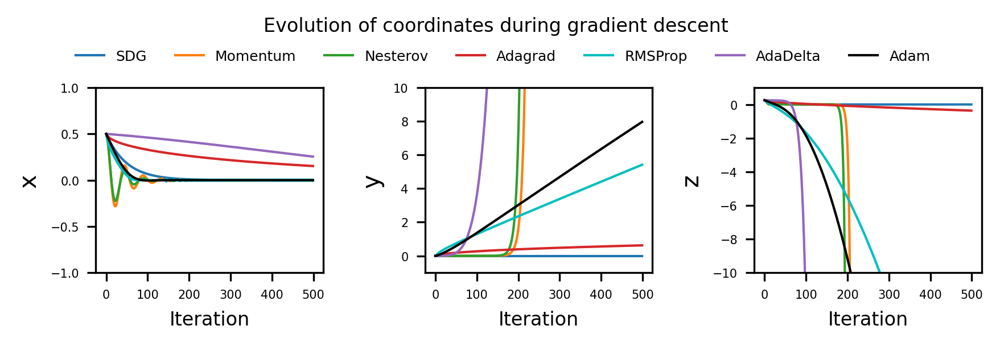

In [ ]:
# Define initialization parameters
n_iters = 500
step_size = 0.01
x_sym, y_sym = .5, 1e-10

data_symmetry = gradient_descent(x_sym, y_sym, step_size ,n_iters)
data_symmetry_Momentum = gradient_descent(x_sym, y_sym, step_size ,n_iters, 0.95)
data_symmetry_Nesterov = NAG(x_sym, y_sym, step_size ,n_iters, 0.95)
data_symmetry_Adagrad = Adagrad(x_sym, y_sym, step_size ,n_iters)
data_symmetry_RMSProp = RMSProp(x_sym, y_sym, step_size ,n_iters, 0.9)
data_symmetry_AdaDelta = AdaDelta(x_sym, y_sym, step_size ,n_iters, 0.9)
data_symmetry_Adam = Adam(x_sym, y_sym, step_size ,n_iters)

fig2, ax2 = plt.subplots(1, 3, figsize = (6, 2), dpi = 300)
plt.rcParams['lines.linewidth'] = 1

ax2[0].plot(data_symmetry[:,0])
ax2[0].plot(data_symmetry_Momentum[:,0])
ax2[0].plot(data_symmetry_Nesterov[:,0])
ax2[0].plot(data_symmetry_Adagrad[:,0])
ax2[0].plot(data_symmetry_RMSProp[:,0], 'c')
ax2[0].plot(data_symmetry_AdaDelta[:,0])
ax2[0].plot(data_symmetry_Adam[:,0], 'k')
ax2[0].set_xlabel('Iteration', fontsize = 8)
ax2[0].set_ylabel('x')
ax2[0].set_ylim(-1, 1)
ax2[0].tick_params(labelsize= 5)

ax2[1].plot(data_symmetry[:,1])
ax2[1].plot(data_symmetry_Momentum[:,1])
ax2[1].plot(data_symmetry_Nesterov[:,1])
ax2[1].plot(data_symmetry_Adagrad[:,1])
ax2[1].plot(data_symmetry_RMSProp[:,1], 'c')
ax2[1].plot(data_symmetry_AdaDelta[:,1])
ax2[1].plot(data_symmetry_Adam[:,1], 'k')
ax2[1].set_xlabel('Iteration', fontsize = 8)
ax2[1].set_ylabel('y')
ax2[1].set_ylim(-1, 10)
ax2[1].tick_params(labelsize= 5)
# ax2[1].set_ylim(-0.5, 1)


ax2[2].plot(data_symmetry[:,2], label = 'SDG')
ax2[2].plot(data_symmetry_Momentum[:,2], label = 'Momentum')
ax2[2].plot(data_symmetry_Nesterov[:,2], label = 'Nesterov')
ax2[2].plot(data_symmetry_Adagrad[:,2], label = 'Adagrad')
ax2[2].plot(data_symmetry_RMSProp[:,2], label = 'RMSProp', color = 'c')
ax2[2].plot(data_symmetry_AdaDelta[:,2], label = 'AdaDelta')
ax2[2].plot(data_symmetry_Adam[:,2], label = 'Adam', color = 'k')
ax2[2].set_xlabel('Iteration', fontsize = 8)
ax2[2].set_ylabel('z')
ax2[2].set_ylim(-10, 1)
ax2[2].tick_params(labelsize= 5)



handles, labels = ax2[2].get_legend_handles_labels()
fig2.legend(handles, labels, loc=(0.07, 0.8), fancybox = False, frameon = False, ncols = 7, fontsize = 6)
fig2.suptitle('Evolution of coordinates during gradient descent', y = 0.99, fontsize =8)

fig2.tight_layout()
fig2.savefig(f'coordinates_results_{step_size}.jpeg', dpi = 300, bbox_inches='tight',)


<ipython-input-40-31317c87b249>:9: UserWarning: The following kwargs were not used by contour: 'normalize'
  cntr1 = ax.contourf(X, Y, f([X, Y]), levels = 50, alpha = 0.6, cmap = 'coolwarm', normalize = 'linear', vmax = 1, vmin = -2)
<ipython-input-40-31317c87b249>:10: UserWarning: The following kwargs were not used by contour: 'normalize'
  ax.contour(X, Y, f([X, Y]), levels = 50, linewidths = 1, cmap = 'coolwarm', normalize = 'linear', vmax = 1, vmin = -2)


(-0.5, 0.6)

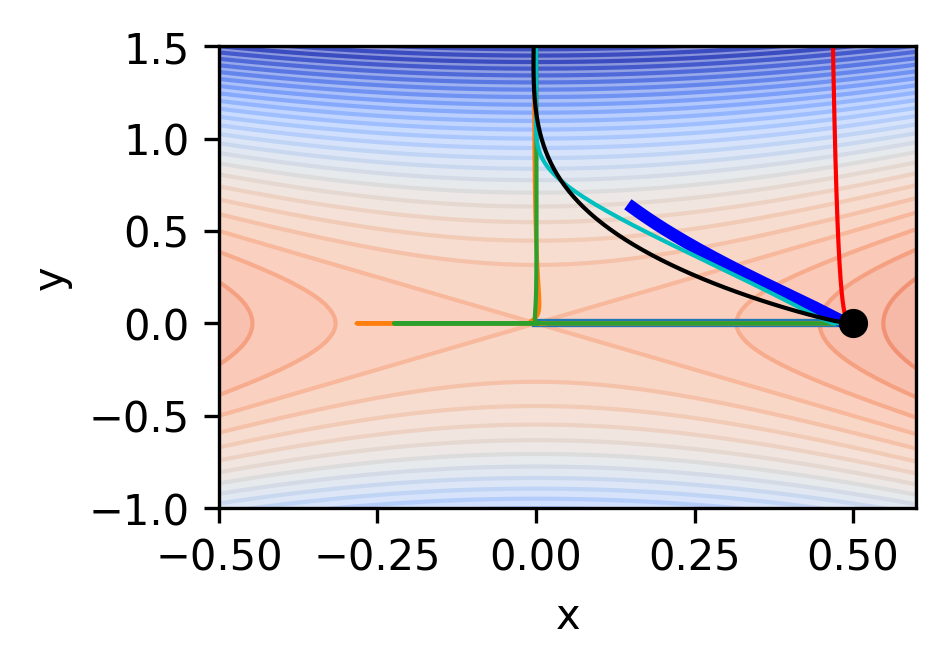

In [ ]:
contour_fig, ax = plt.subplots( figsize = (3, 2), dpi = 300)

delta = 0.025
x_contour = np.arange(-1, 1, delta)
y_contour = np.arange(-2,2, delta)
#
X, Y = np.meshgrid(x_contour, y_contour)
levels = np.arange(-5, 5, 0.05)
cntr1 = ax.contourf(X, Y, f([X, Y]), levels = 50, alpha = 0.6, cmap = 'coolwarm', normalize = 'linear', vmax = 1, vmin = -2)
ax.contour(X, Y, f([X, Y]), levels = 50, linewidths = 1, cmap = 'coolwarm', normalize = 'linear', vmax = 1, vmin = -2)

ax.plot(data_symmetry[:,0], data_symmetry[:,1], '-o', markersize = 0.5, linewidth = 2)
ax.plot(data_symmetry_Momentum[:,0], data_symmetry_Momentum[:,1],  linewidth = 1)
ax.plot(data_symmetry_Nesterov[:,0], data_symmetry_Nesterov[:,1], linewidth = 1)
ax.plot(data_symmetry_Adagrad[:,0], data_symmetry_Adagrad[:,1], linewidth = 3, color = 'b')
ax.plot(data_symmetry_RMSProp[:,0], data_symmetry_RMSProp[:,1], linewidth = 1, color = 'c')
ax.plot(data_symmetry_AdaDelta[:,0], data_symmetry_AdaDelta[:,1], linewidth = 1, color = 'r')
ax.plot(data_symmetry_Adam[:,0], data_symmetry_Adam[:,1],  linewidth = 1, color = 'k')
ax.plot(x_sym, y_sym, 'ko')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_ylim([-1, 1.5])
ax.set_xlim([-0.5, .6])


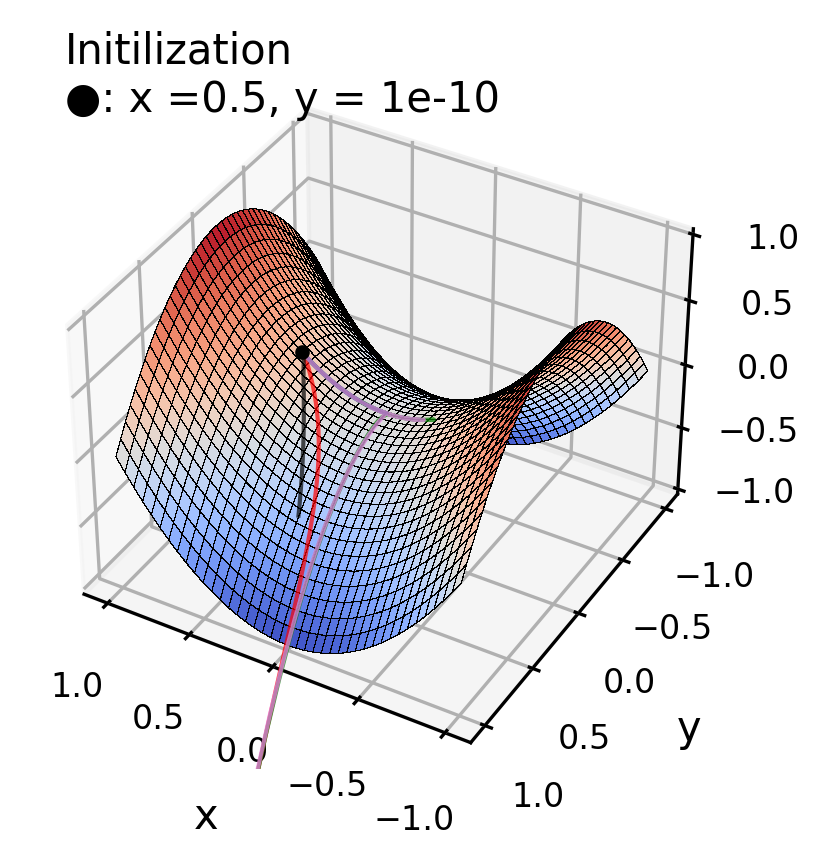

In [ ]:
newax = fig1.add_axes(ax1.get_position(), projection='3d',
                     xlim = ax1.get_xlim(),
                     ylim = ax1.get_ylim(),
                     zlim = ax1.get_zlim(),
                     facecolor = 'none',)
newax.view_init(azim= 120, elev= 37)
newax.set_zorder(1)
ax1.set_zorder(0)

newax.plot3D(data_symmetry[:,0], data_symmetry[:, 1],
              data_symmetry[:, 2], c='blue', alpha = 0.7)
newax.plot3D(data_symmetry_Adam[:,0], data_symmetry_Adam[:, 1],
              data_symmetry_Adam[:, 2], c='red', alpha = 0.7)
newax.plot3D(data_symmetry_Momentum[:,0], data_symmetry_Momentum[:, 1],
              data_symmetry_Momentum[:, 2], c='green', alpha = 0.7)
newax.plot3D(data_symmetry_Nesterov[:,0], data_symmetry_Nesterov[:, 1],
              data_symmetry_Nesterov[:, 2], c='violet', alpha = 0.7)
newax.plot3D(data_symmetry_Adagrad[:,0], data_symmetry_Adagrad[:, 1],
              data_symmetry_Adagrad[:, 2], c='black', alpha = 0.7)


newax.plot3D(data_symmetry[0, 0], data_symmetry[0, 1], data_symmetry[0, 2],
               ms = 2.5, c='black', marker='o')
newax.set_axis_off()
sq = u'■'
cir = u'●'
ax1.text2D(0.05, 0.95, f'Initilization\n'\
                      f'{cir}: x ={x_sym}, y = {y_sym}', transform=ax1.transAxes)

# fig1.savefig('gradient_descent_static.jpeg')
fig1

In [ ]:
def descent_animation_Advanced(num):
    # Clear the axes where we are plotting the tracjectories
    newax.clear()
    nag_ax.clear()
    mom_ax.clear()

    # Manually adjust the order of the axes

    nag_ax.set_zorder(3)
    mom_ax.set_zorder(2)
    newax.set_zorder(1)
    ax.set_zorder(0)

    # Hide the axes in the front plane
    newax.set_axis_off()
    nag_ax.set_axis_off()
    mom_ax.set_axis_off()

    for label, info in optims.items():
      # Plot new frame of trajectory line
      data = info[0]
      color = info[1]
      posn = info[2]
      if posn == 1:
        newax.plot3D(data[:num+1, 0], data[:num+1, 1], data[:num+1, 2],
                    alpha = 0.8, label = label, color = color)

        # Updating Point Location
        newax.scatter(data[num, 0], data[num, 1], data[num, 2],
                s = 10, marker='o', edgecolor = 'k', linewidth = 0.5,
                      color = color)
      if posn == 2:
        mom_ax.plot3D(data[:num+1, 0], data[:num+1, 1], data[:num+1, 2],
                    alpha = 0.8, label = label, color = color)

        # Updating Point Location
        mom_ax.scatter(data[num, 0], data[num, 1], data[num, 2],
                s = 10, marker='o', edgecolor = 'k', linewidth = 0.5,
                      color = color)

      if posn == 3:
        nag_ax.plot3D(data[:num+1, 0], data[:num+1, 1], data[:num+1, 2],
                    alpha = 0.8, label = label, color = color)

        # Updating Point Location
        nag_ax.scatter(data[num, 0], data[num, 1], data[num, 2],
                s = 10, marker='o', edgecolor = 'k', linewidth = 0.5,
                      color = color)

    # Adding Constant Origin
    newax.plot3D(data_symmetry[0, 0], data_symmetry[0, 1], data_symmetry[0, 2],
               ms = 2.5, c='black', marker='o')


    # Setting Axes Limits and view angles
    newax.set_xlim3d(limx)
    newax.set_ylim3d(limy)
    newax.set_zlim3d(limz)
    newax.view_init(azim= azim, elev= elev)

    mom_ax.set_xlim3d(limx)
    mom_ax.set_ylim3d(limy)
    mom_ax.set_zlim3d(limz)
    mom_ax.view_init(azim= azim, elev= elev)

    nag_ax.set_xlim3d(limx)
    nag_ax.set_ylim3d(limy)
    nag_ax.set_zlim3d(limz)
    nag_ax.view_init(azim= azim, elev= elev)

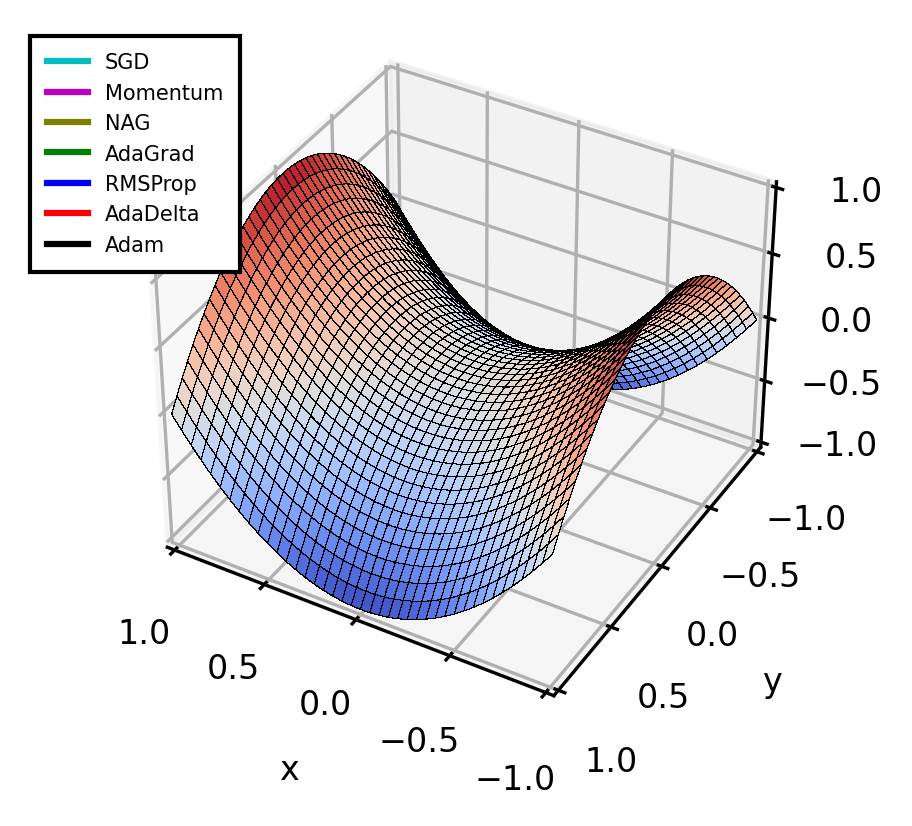

In [ ]:
optims = {'SGD' : [data_symmetry, 'c', 1],
            'Momentum': [data_symmetry_Momentum, 'm', 2],
            'NAG': [data_symmetry_Nesterov, 'olive', 3],
            'AdaGrad': [data_symmetry_Adagrad, 'g', 1],
            'RMSProp': [data_symmetry_RMSProp, 'b', 1],
            'AdaDelta': [data_symmetry_AdaDelta, 'r', 1],
            'Adam': [data_symmetry_Adam, 'k', 1]}

# Define global parameters for plotting
plot_args = {'rstride': 2, 'cstride': 2, 'cmap':"coolwarm",
            'linewidth': 0.01, 'antialiased': False,
            'vmin': -1, 'vmax': 1, 'edgecolors':'k'}

# 3D view orientation
azim = 120
elev = 37

# Common axes limits
limx = [-1,1]
limy = [-1,1]
limz = [-1,1]

# Generate grid of points
x, y = np.mgrid[-1:1:81j, -1:1:81j]


# Create figure
fig = plt.figure(figsize = (3.5, 3), dpi = 300)
ax = fig.add_subplot(111, projection='3d')


ax.plot_surface(x, y, f([x,y]), **plot_args)
ax.view_init(azim= azim, elev= elev)
ax.set_xlim3d(limx)
ax.set_ylim3d(limy)
ax.set_zlim3d(limz)

font = 8
ax.set_xlabel('x', fontsize = font)
# ax.set_xticks([-2, -1, 0, 1])
ax.set_ylabel('y', fontsize = font)
ax.set_zlabel('z', fontsize = font)
ax.tick_params(labelsize= font)



# Add new axes to plot the trajectories
newax = fig.add_axes(ax.get_position(), projection='3d',
                    xlim = ax.get_xlim(),
                    ylim = ax.get_ylim(),
                    zlim = ax.get_zlim(),
                    facecolor = 'none',)
newax.view_init(azim= azim, elev= elev)

mom_ax = fig.add_axes(ax.get_position(), projection='3d',
                    xlim = ax.get_xlim(),
                    ylim = ax.get_ylim(),
                    zlim = ax.get_zlim(),
                    facecolor = 'none',)
mom_ax.view_init(azim= azim, elev= elev)

nag_ax = fig.add_axes(ax.get_position(), projection='3d',
                    xlim = ax.get_xlim(),
                    ylim = ax.get_ylim(),
                    zlim = ax.get_zlim(),
                    facecolor = 'none',)
nag_ax.view_init(azim= azim, elev= elev)

nag_ax.set_zorder(3)
mom_ax.set_zorder(2)
newax.set_zorder(1)
ax.set_zorder(0)
newax.set_axis_off()
nag_ax.set_axis_off()
mom_ax.set_axis_off()



# Include legend
custom_lines = [Line2D([0], [0], color = data[1], lw=1.5)   for label, data in optims.items()]
ax.legend(custom_lines, optims.keys(), fancybox = False, fontsize = 5, frameon = True, ncols = 1, loc = (-0.12, 0.65), framealpha = 1, edgecolor = 'k', borderpad = 0.8)


# Plotting the Animation
line_ani_Adv= animation.FuncAnimation(fig, descent_animation_Advanced, interval=1,
                                   frames= n_iters)
plt.show()

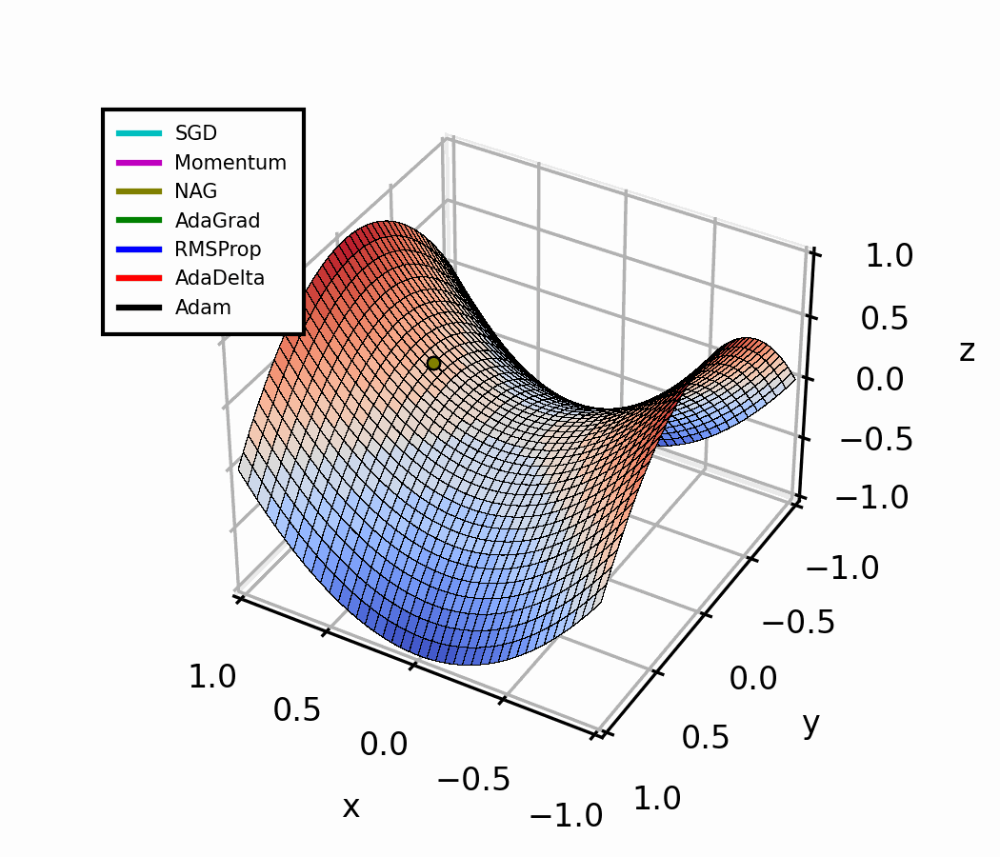

In [ ]:
filename = "Advanced_optimizations_Saddle.gif"
writergif = animation.PillowWriter(fps=100)
line_ani_Adv.save(filename, writer=writergif)


# Display the animated figure
Image(open(filename,'rb').read())

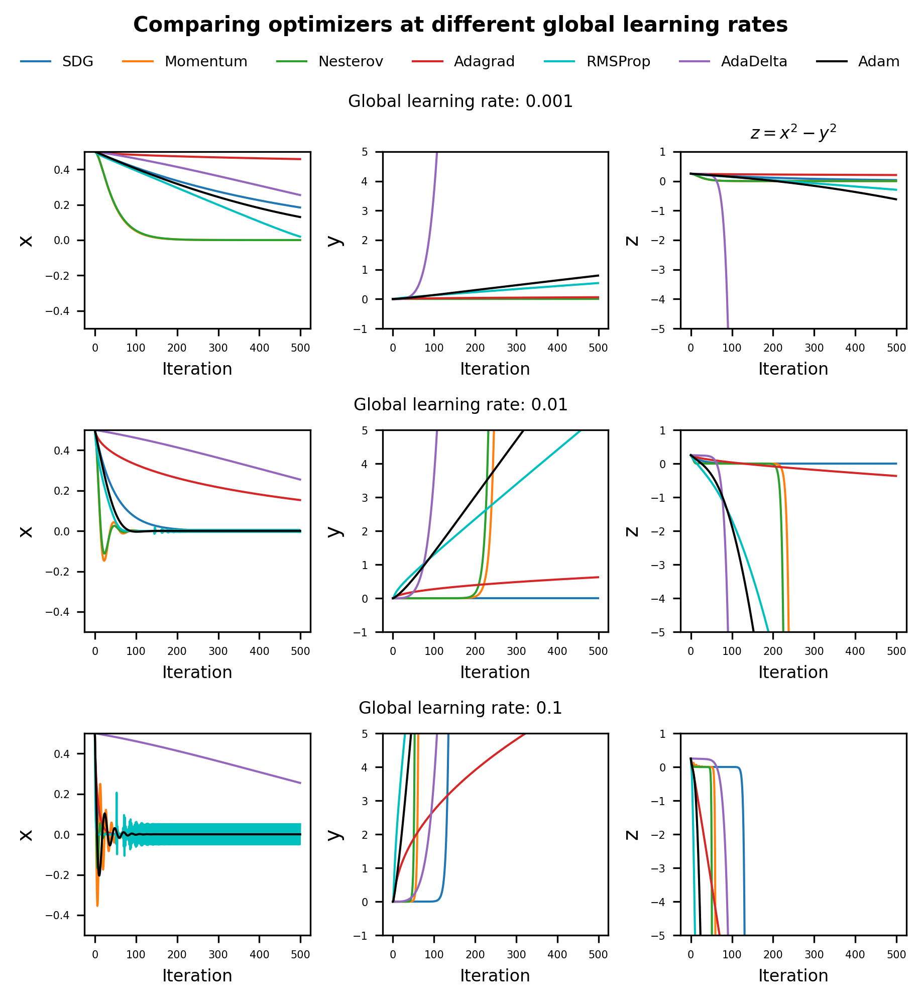

In [ ]:
n_iters = 500
step_sizes = [0.001, 0.01, 0.1]

x_init, y_init = .5, 1e-10


fig2, axs = plt.subplots(3, 1, figsize = (6, 6), dpi = 300, constrained_layout=True)
plt.rcParams['lines.linewidth'] = 1


# clear subplots
for ax in axs:
    ax.remove()

# add subfigure per subplot
gridspec = axs[0].get_subplotspec().get_gridspec()
subfigs = [fig2.add_subfigure(gs) for gs in gridspec]


for row, subfig in enumerate(subfigs):
  step_size = step_sizes[row]
  subfig.suptitle(f'Global learning rate: {step_size}', fontsize = 8)

  data_SGD = gradient_descent(x_init, y_init, step_size ,n_iters)
  data_Momentum = gradient_descent(x_init, y_init, step_size ,n_iters, 0.9)
  data_Nesterov = NAG(x_init, y_init, step_size ,n_iters, 0.9)
  data_Adagrad = Adagrad(x_init, y_init, step_size ,n_iters)
  data_RMSProp = RMSProp(x_init, y_init, step_size ,n_iters, 0.9)
  data_AdaDelta = AdaDelta(x_init, y_init, step_size ,n_iters, 0.9)
  data_Adam = Adam(x_init, y_init, step_size ,n_iters)


  # create 1x3 subplots per subfig
  axs = subfig.subplots(nrows=1, ncols=3,)

  axs[0].plot(data_SGD[:,0])
  axs[0].plot(data_Momentum[:,0])
  axs[0].plot(data_Nesterov[:,0])
  axs[0].plot(data_Adagrad[:,0])
  axs[0].plot(data_RMSProp[:,0], 'c')
  axs[0].plot(data_AdaDelta[:,0])
  axs[0].plot(data_Adam[:,0], 'k')
  axs[0].set_xlabel('Iteration', fontsize = 8)
  axs[0].set_ylabel('x')
  axs[0].set_ylim(-0.5, 0.5)
  axs[0].tick_params(labelsize= 5)

  axs[1].plot(data_SGD[:,1])
  axs[1].plot(data_Momentum[:,1])
  axs[1].plot(data_Nesterov[:,1])
  axs[1].plot(data_Adagrad[:,1])
  axs[1].plot(data_RMSProp[:,1], 'c')
  axs[1].plot(data_AdaDelta[:,1])
  axs[1].plot(data_Adam[:,1], 'k')
  axs[1].set_xlabel('Iteration', fontsize = 8)
  axs[1].set_ylabel('y')
  axs[1].set_ylim(-1, 5)
  axs[1].tick_params(labelsize= 5)

  axs[2].plot(data_SGD[:,2], label = 'SDG')
  axs[2].plot(data_Momentum[:,2], label = 'Momentum')
  axs[2].plot(data_Nesterov[:,2], label = 'Nesterov')
  axs[2].plot(data_Adagrad[:,2], label = 'Adagrad')
  axs[2].plot(data_RMSProp[:,2], label = 'RMSProp', color = 'c')
  axs[2].plot(data_AdaDelta[:,2], label = 'AdaDelta')
  axs[2].plot(data_Adam[:,2], label = 'Adam', color = 'k')
  axs[2].set_xlabel('Iteration', fontsize = 8)
  axs[2].set_ylabel('z')
  axs[2].set_ylim(-5, 1)
  axs[2].tick_params(labelsize= 5)
  if row == 0:
    axs[2].set_title('$z = x^2 - y^2$',fontsize = 8)
  if row == 2:
    handles, labels = axs[2].get_legend_handles_labels()


fig2.suptitle('Comparing optimizers at different global learning rates', fontsize =10, fontweight = 'bold', y = 1.08)
leg = fig2.legend(handles, labels, loc='upper center', fancybox = False, frameon = False, ncols = 7, fontsize = 7,  bbox_to_anchor=(0.5, 1.05))

fig2.savefig('coordinates_results_Iters.jpeg', dpi = 300, bbox_inches='tight',pad_inches = 0.3)

## Comparison of Different Gradient descent optimization algorithms in Cardiovascular Disease prediction

#**1.Import Libraries**

In [ ]:
!pip install --upgrade pydantic

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 26.4 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
    Uninstalling typing_extensions-4.5.0:
      Successfully uninstalled typing_extensions-4.5.0
  Attempting uninstall: pydantic
    Found existing installation: pydantic 1.10.13
    Uninstalling pydantic-1.10.13:
      Successfully uninstalled pydantic-1.10.13
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
llmx 0.0.15a0 requires cohere, which is not installed.
llmx 0.0.15a0 requires

In [ ]:
!pip install pydantic-settings

In [ ]:
!pip install pandas_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.8/357.8 kB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 14.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 35.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 30.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 65.7 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=6e71877a723cbed52eb30f095f4f05169e358101659e9099b227372dae21ca9f
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     \ 17.8 MB 17.8 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=357887 sha256=bcd819e52f9f550bf5097decd99e2f8a1790024301cb28fd4dcd7837c64b22ff
  Stored in directory: /tmp/pip-ephem-wheel-cache-xacycsz0/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
Successfully built ydata-profiling
  Attempting uninstall: ydata-profiling
    Found existing installation: ydata-profiling 4.6.4
    Uninstalling ydata-profiling-4.6.4:
      Successfully uninstalled ydata-profiling-4.6.4


In [ ]:
# !pip install --upgrade pandas_profiling

In [ ]:
# !pip install typing-extensions

In [ ]:
# import pandas as pd
# import pandas_profiling

In [ ]:
!pip uninstall tensorflow
!pip install tensorflow==2.12.0

Found existing installation: tensorflow 2.15.0
Uninstalling tensorflow-2.15.0:
  Would remove:
    /usr/local/bin/estimator_ckpt_converter
    /usr/local/bin/import_pb_to_tensorboard
    /usr/local/bin/saved_model_cli
    /usr/local/bin/tensorboard
    /usr/local/bin/tf_upgrade_v2
    /usr/local/bin/tflite_convert
    /usr/local/bin/toco
    /usr/local/bin/toco_from_protos
    /usr/local/lib/python3.10/dist-packages/tensorflow-2.15.0.dist-info/*
    /usr/local/lib/python3.10/dist-packages/tensorflow/*
Proceed (Y/n)? Y
Y
  Successfully uninstalled tensorflow-2.15.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 MB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 84.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 100.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 49.5 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.15.0

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import os
# preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
import pandas_profiling as pp

# models
from sklearn.linear_model import LogisticRegression, Perceptron, RidgeClassifier, SGDClassifier



from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
import xgboost as xgb

import lightgbm as lgb


# NN models
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras import optimizers
from keras.wrappers.scikit_learn import KerasClassifier
from keras.callbacks import EarlyStopping, ModelCheckpoint

# model tuning
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe, space_eval

# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

from sklearn.metrics import accuracy_score, precision_score, recall_score


import seaborn as sns
from sklearn import metrics
# from keras.models import Sequential
# from keras.layers import Dense, Dropout
# from keras import optimizers
import time

<ipython-input-9-7457e1b7e4a4>:9: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


#**2.Download datasets**

In [ ]:
# !pip install kaggle

In [ ]:
import io

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving cardio_train.csv to cardio_train.csv


In [ ]:
filename = next(iter(uploaded))

In [ ]:
data = pd.read_csv(filename, sep=";")

In [ ]:
data.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


In [ ]:
data.isnull().sum()

id             0
age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64

In [ ]:
data.columns

Index(['id', 'age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo',
       'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='object')

In [ ]:
data.drop("id",axis=1,inplace=True)
data.drop_duplicates(inplace=True)
data["bmi"] = data["weight"] / (data["height"]/100)**2
out_filter = ((data["ap_hi"]>250) | (data["ap_lo"]>200))
data = data[~out_filter]
len(data)

68983

In [ ]:
out_filter2 = ((data["ap_hi"] < 0) | (data["ap_lo"] < 0))
data = data[~out_filter2]

In [ ]:
data.head(3)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
0,18393,2,168,62.0,110,80,1,1,0,0,1,0,21.967120
1,20228,1,156,85.0,140,90,3,1,0,0,1,1,34.927679
2,18857,1,165,64.0,130,70,3,1,0,0,0,1,23.507805


In [ ]:
data.columns

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active', 'cardio', 'bmi'],
      dtype='object')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68975 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          68975 non-null  int64  
 1   gender       68975 non-null  int64  
 2   height       68975 non-null  int64  
 3   weight       68975 non-null  float64
 4   ap_hi        68975 non-null  int64  
 5   ap_lo        68975 non-null  int64  
 6   cholesterol  68975 non-null  int64  
 7   gluc         68975 non-null  int64  
 8   smoke        68975 non-null  int64  
 9   alco         68975 non-null  int64  
 10  active       68975 non-null  int64  
 11  cardio       68975 non-null  int64  
 12  bmi          68975 non-null  float64
dtypes: float64(2), int64(11)
memory usage: 7.4 MB


#**3.EDA**

In [ ]:
pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#**4.Preparing to Modeling**

In [ ]:
target_name = 'cardio'
data_target = data[target_name]
data = data.drop([target_name], axis=1)

In [ ]:
data.columns

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active', 'bmi'],
      dtype='object')

In [ ]:
data.head(2)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,bmi
0,18393,2,168,62.0,110,80,1,1,0,0,1,21.967120
1,20228,1,156,85.0,140,90,3,1,0,0,1,34.927679


I split data on 20% in the test dataset, the remaining 80% - in the training dataset

In [ ]:
train, test, target, target_test = train_test_split(data, data_target, test_size=0.2, random_state=0)

In [ ]:
train.head(2)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,bmi
31684,21263,2,160,76.0,130,80,1,1,0,1,1,29.687500
5634,14684,2,184,70.0,120,80,1,1,0,0,1,20.675803


In [ ]:
test.head(2)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,bmi
51756,20272,1,161,75.0,120,80,1,1,0,0,1,28.934069
9378,21872,1,175,70.0,120,70,1,1,0,0,1,22.857143


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55180 entries, 31684 to 69281
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          55180 non-null  int64  
 1   gender       55180 non-null  int64  
 2   height       55180 non-null  int64  
 3   weight       55180 non-null  float64
 4   ap_hi        55180 non-null  int64  
 5   ap_lo        55180 non-null  int64  
 6   cholesterol  55180 non-null  int64  
 7   gluc         55180 non-null  int64  
 8   smoke        55180 non-null  int64  
 9   alco         55180 non-null  int64  
 10  active       55180 non-null  int64  
 11  bmi          55180 non-null  float64
dtypes: float64(2), int64(10)
memory usage: 5.5 MB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13795 entries, 51756 to 61199
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          13795 non-null  int64  
 1   gender       13795 non-null  int64  
 2   height       13795 non-null  int64  
 3   weight       13795 non-null  float64
 4   ap_hi        13795 non-null  int64  
 5   ap_lo        13795 non-null  int64  
 6   cholesterol  13795 non-null  int64  
 7   gluc         13795 non-null  int64  
 8   smoke        13795 non-null  int64  
 9   alco         13795 non-null  int64  
 10  active       13795 non-null  int64  
 11  bmi          13795 non-null  float64
dtypes: float64(2), int64(10)
memory usage: 1.4 MB


In [ ]:
#split training set to validation set
Xtrain, Xval, Ztrain, Zval = train_test_split(train, target, test_size=0.2, random_state=0)

#**5. Tuning models and test for all features**

Thanks to https://www.kaggle.com/startupsci/titanic-data-science-solutions

Now we are ready to train a model and predict the required solution. There are 60+ predictive modelling algorithms to choose from. We must understand the type of problem and solution requirement to narrow down to a select few models which we can evaluate. Our problem is a classification and regression problem. We want to identify relationship between output (Survived or not) with other variables or features (Gender, Age, Port...). We are also perfoming a category of machine learning which is called supervised learning as we are training our model with a given dataset. With these two criteria - Supervised Learning plus Classification and Regression, we can narrow down our choice of models to a few. These include:

Logistic Regression
Support Vector Machines and Linear SVC
KNN or k-Nearest Neighbors
Naive Bayes Classifier or Gaussian Naive Bayes
Stochastic Gradient Descent, GradientBoostingClassifier, RidgeClassifier, BaggingClassifier
Decision Tree Classifier, Random Forest, XGB Classifier, LGBM Classifier, ExtraTreesClassifier
Perceptron, Neural Networks with different archictures (Deep Learning)
VotingClassifier (hard or soft voting)

#**5.1 Neural Network 1**

Thanks to https://www.kaggle.com/nhlr21/complete-titanic-tutorial-with-ml-nn-ensembling

Neural networks are more complex and more powerful algorithm than standars machine learning, it belongs to deep learning models. To build a neural network use Keras. Keras is a high level API for tensorflow, which is a tensor-manipulation framework made by google. Keras allows you to build neural networks by assembling blocks (which are the layers of neural network).

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 dense_56 (Dense)            (None, 32)                416       
                                                                 
 dense_57 (Dense)            (None, 64)                2112      
                                                                 
 dropout_28 (Dropout)        (None, 64)                0         
                                                                 
 dense_58 (Dense)            (None, 64)                4160      
                                                                 
 dropout_29 (Dropout)        (None, 64)                0         
                                                                 
 dense_59 (Dense)            (None, 1)                 65        
                                                                 
=================================================================
Total params: 6,753
Trainable params: 6,753
Non-trainable params: 0
_________________________________________________________________

In [ ]:
# train, test, target, target_test = train_test_split(data, data_target, test_size=0.2, random_state=0)
# Xtrain, Xval, Ztrain, Zval = train_test_split(train, target, test_size=0.2, random_state=0)

432/432 [==============================] - 0s 878us/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


432/432 [==============================] - 0s 898us/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


432/432 [==============================] - 0s 900us/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


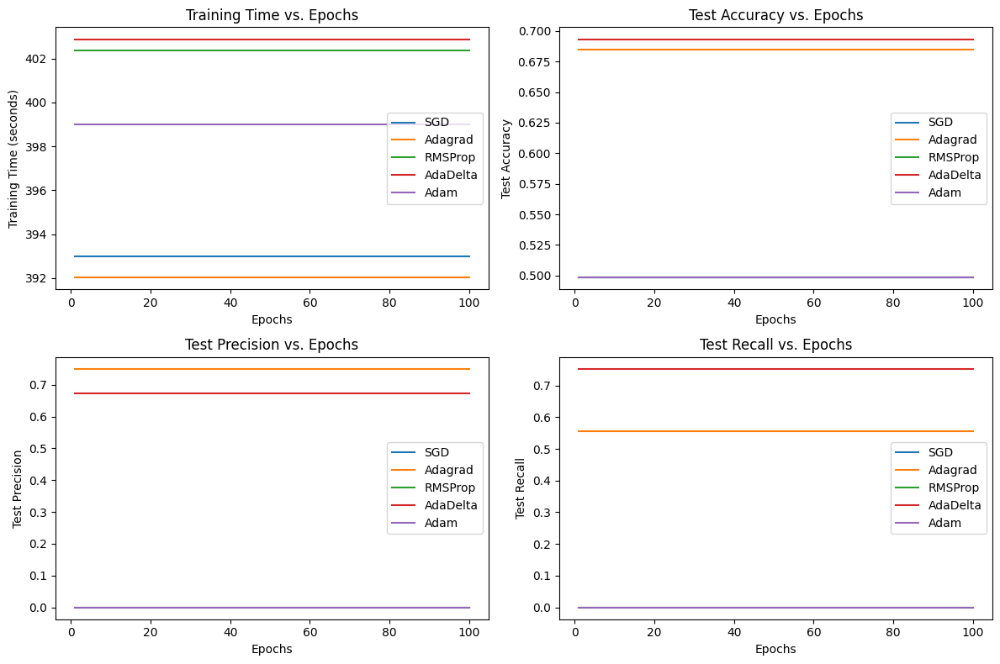

  optimizer  test_accuracy  test_precision  test_recall  training_time
0       SGD       0.498514        0.000000     0.000000     392.987264
1   Adagrad       0.684378        0.749903     0.556086     392.024662
2   RMSProp       0.498514        0.000000     0.000000     402.379204
3  AdaDelta       0.693295        0.674051     0.752096     402.890757
4      Adam       0.498514        0.000000     0.000000     399.013133


In [ ]:
# Define a function to build the ANN with the specified optimizer
def build_ann(optimizer='adam'):
    ann = Sequential()
    ann.add(Dense(units=32, kernel_initializer='glorot_uniform', activation='relu', input_shape=(len(train.columns),)))
    ann.add(Dense(units=64, kernel_initializer='glorot_uniform', activation='relu'))
    ann.add(Dropout(rate=0.5))
    ann.add(Dense(units=64, kernel_initializer='glorot_uniform', activation='relu'))
    ann.add(Dropout(rate=0.5))
    ann.add(Dense(units=1, kernel_initializer='glorot_uniform', activation='sigmoid'))
    ann.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return ann


# Define a function to train and evaluate the ANN
def train_and_evaluate_ann(optimizer, Xtrain, Ztrain, Xval, Zval, Xtest, Ztest, epochs=100):
    ann = build_ann(optimizer)
    start_time = time.time()
    history = ann.fit(Xtrain, Ztrain, batch_size=16, epochs=epochs, validation_data=(Xval, Zval), verbose=0)
    end_time = time.time()

    # Predict on train, validation, and test sets
    # train_predictions = (ann.predict(Xtrain) > 0.5).astype(int)
    # val_predictions = (ann.predict(Xval) > 0.5).astype(int)
    test_predictions = (ann.predict(Xtest) > 0.5).astype(int)

    # Calculate metrics
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    # train_accuracy = accuracy_score(Ztrain, train_predictions)
    # val_accuracy = accuracy_score(Zval, val_predictions)
    test_accuracy = accuracy_score(Ztest, test_predictions)
    # train_precision = precision_score(Ztrain, train_predictions)
    # val_precision = precision_score(Zval, val_predictions)
    test_precision = precision_score(Ztest, test_predictions)
    # train_recall = recall_score(Ztrain, train_predictions)
    # val_recall = recall_score(Zval, val_predictions)
    test_recall = recall_score(Ztest, test_predictions)

    training_time = end_time - start_time
    if model_save_path:
        ann.save(model_save_path)

    return {
        "optimizer": optimizer,
        "test_accuracy": test_accuracy,
        "test_precision": test_precision,
        "test_recall": test_recall,
        "training_time": training_time
    }

# List of optimizers to compare
optimizers_to_compare = {
    "SGD": optimizers.SGD(learning_rate=0.001),
    #"GD with Momentum": optimizers.SGD(learning_rate=0.001, momentum=0.9),
    #"NAG": optimizers.SGD(learning_rate=0.001, momentum=0.9, nesterov=True),
    "Adagrad": optimizers.Adagrad(learning_rate=0.001),
    "RMSProp": optimizers.RMSprop(learning_rate=0.001),
    "AdaDelta": optimizers.Adadelta(),
    "Adam": optimizers.Adam(learning_rate=0.001)
}

# Data storage
results = []

# Training and evaluating the neural network for each optimizer
for optimizer_name, optimizer_instance in optimizers_to_compare.items():
    model_save_path = f"{optimizer_name}_model.h5"  # Define the path where the model will be saved
    result = train_and_evaluate_ann(optimizer_name, Xtrain, Ztrain, Xval, Zval, test, target_test, epochs=100)
    results.append(result)

# Create a figure for visualizations
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Visualize training time vs. Number of Epochs
for result in results:
    axs[0, 0].plot(range(1, 101), [result["training_time"]] * 100, label=result["optimizer"])
axs[0, 0].set_xlabel('Epochs')
axs[0, 0].set_ylabel('Training Time (seconds)')
axs[0, 0].legend()
axs[0, 0].set_title('Training Time vs. Epochs')

# Visualize test accuracy vs. Number of Epochs
for result in results:
    epochs = range(1, 101)
    test_accuracy = [result["test_accuracy"]] * 100
    axs[0, 1].plot(epochs, test_accuracy, label=result["optimizer"])
axs[0, 1].set_xlabel('Epochs')
axs[0, 1].set_ylabel('Test Accuracy')
axs[0, 1].legend()
axs[0, 1].set_title('Test Accuracy vs. Epochs')

# Visualize test precision vs. Number of Epochs
for result in results:
    epochs = range(1, 101)
    test_precision = [result["test_precision"]] * 100
    axs[1, 0].plot(epochs, test_precision, label=result["optimizer"])
axs[1, 0].set_xlabel('Epochs')
axs[1, 0].set_ylabel('Test Precision')
axs[1, 0].legend()
axs[1, 0].set_title('Test Precision vs. Epochs')

# Visualize test recall vs. Number of Epochs
for result in results:
    epochs = range(1, 101)
    test_recall = [result["test_recall"]] * 100
    axs[1, 1].plot(epochs, test_recall, label=result["optimizer"])
axs[1, 1].set_xlabel('Epochs')
axs[1, 1].set_ylabel('Test Recall')
axs[1, 1].legend()
axs[1, 1].set_title('Test Recall vs. Epochs')

# Adjust layout and show plots
plt.tight_layout()
plt.show()

# Create a table of results
results_df = pd.DataFrame(results)
results_df.to_csv('optimization_results.csv', index=False)
print(results_df)

#**Neural Network 2**

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
=================================================================
dense_5 (Dense)              (None, 16)                208       
_________________________________________________________________
dropout_3 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 64)                1088      
_________________________________________________________________
dropout_4 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 33        
=================================================================
Total params: 3,409
Trainable params: 3,409
Non-trainable params: 0

432/432 [==============================] - 0s 944us/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


432/432 [==============================] - 0s 900us/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


432/432 [==============================] - 0s 944us/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


432/432 [==============================] - 0s 917us/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


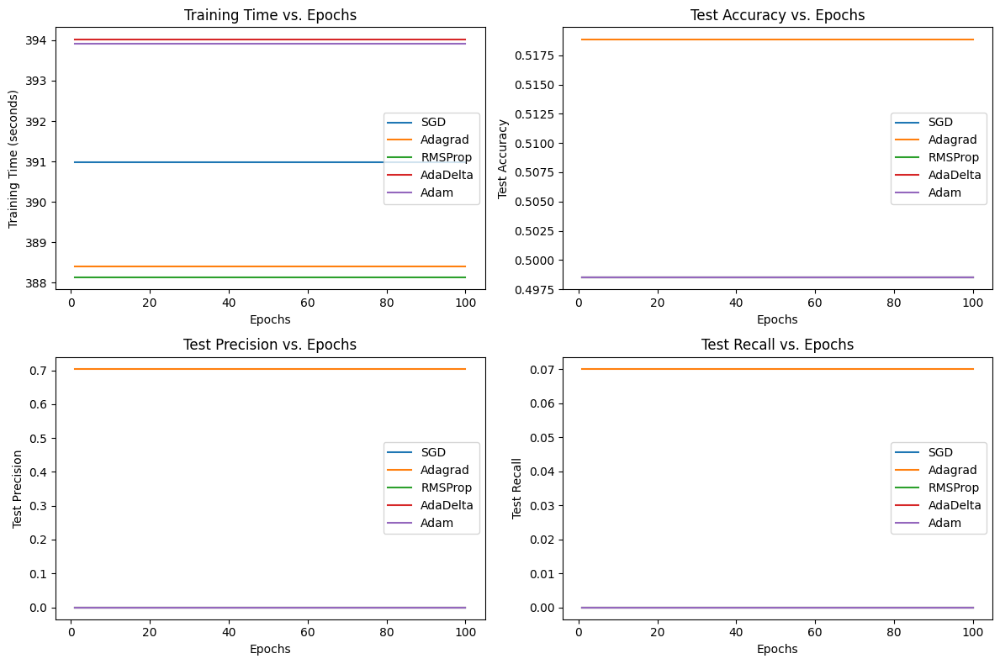

  optimizer  test_accuracy  test_precision  test_recall  training_time
0       SGD       0.498514        0.000000     0.000000     390.973553
1   Adagrad       0.518884        0.703919     0.070107     388.409893
2   RMSProp       0.498514        0.000000     0.000000     388.130430
3  AdaDelta       0.498514        0.000000     0.000000     394.029000
4      Adam       0.498514        0.000000     0.000000     393.909410


In [ ]:

# Define a function to build the provided neural network
def build_custom_nn(optimizer='adam'):
    model = Sequential()
    model.add(Dense(16, input_dim=train.shape[1], kernel_initializer='he_normal', activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(64, kernel_initializer='he_normal', activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(32, kernel_initializer='he_normal', activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

# Define a function to train and evaluate the ANN
def train_and_evaluate_ann(optimizer, Xtrain, Ztrain, Xval, Zval, Xtest, Ztest, epochs=100):
    ann = build_custom_nn(optimizer)
    start_time = time.time()
    history = ann.fit(Xtrain, Ztrain, batch_size=16, epochs=epochs, validation_data=(Xval, Zval), verbose=0)
    end_time = time.time()

    # Predict on train, validation, and test sets
    # train_predictions = (ann.predict(Xtrain) > 0.5).astype(int)
    # val_predictions = (ann.predict(Xval) > 0.5).astype(int)
    test_predictions = (ann.predict(Xtest) > 0.5).astype(int)

    # Calculate metrics
    # train_loss = history.history['loss']
    # val_loss = history.history['val_loss']
    # train_accuracy = accuracy_score(Ztrain, train_predictions)
    # val_accuracy = accuracy_score(Zval, val_predictions)
    test_accuracy = accuracy_score(Ztest, test_predictions)
    # train_precision = precision_score(Ztrain, train_predictions)
    # val_precision = precision_score(Zval, val_predictions)
    test_precision = precision_score(Ztest, test_predictions)
    # train_recall = recall_score(Ztrain, train_predictions)
    # val_recall = recall_score(Zval, val_predictions)
    test_recall = recall_score(Ztest, test_predictions)

    training_time = end_time - start_time
    if model_save_path:
        ann.save(model_save_path)
    return {
        "optimizer": optimizer,
        "test_accuracy": test_accuracy,
        "test_precision": test_precision,
        "test_recall": test_recall,
        "training_time": training_time
    }

# List of optimizers to compare
optimizers_to_compare = {
    "SGD": optimizers.SGD(learning_rate=0.001),
    #"GD with Momentum": optimizers.SGD(learning_rate=0.001, momentum=0.9),
    #"NAG": optimizers.SGD(learning_rate=0.001, momentum=0.9, nesterov=True),
    "Adagrad": optimizers.Adagrad(learning_rate=0.001),
    "RMSProp": optimizers.RMSprop(learning_rate=0.001),
    "AdaDelta": optimizers.Adadelta(),
    "Adam": optimizers.Adam(learning_rate=0.001)
}

# Data storage
results = []

# Training and evaluating the neural network for each optimizer
for optimizer_name, optimizer_instance in optimizers_to_compare.items():
    model_save_path = f"{optimizer_name}_model-2.h5"  # Define the path where the model will be saved
    result = train_and_evaluate_ann(optimizer_name, Xtrain, Ztrain, Xval, Zval, test, target_test, epochs=100)
    results.append(result)

# Create a figure for visualizations
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Visualize training time vs. Number of Epochs
for result in results:
    axs[0, 0].plot(range(1, 101), [result["training_time"]] * 100, label=result["optimizer"])
axs[0, 0].set_xlabel('Epochs')
axs[0, 0].set_ylabel('Training Time (seconds)')
axs[0, 0].legend()
axs[0, 0].set_title('Training Time vs. Epochs')

# Visualize test accuracy vs. Number of Epochs
for result in results:
    epochs = range(1, 101)
    test_accuracy = [result["test_accuracy"]] * 100
    axs[0, 1].plot(epochs, test_accuracy, label=result["optimizer"])
axs[0, 1].set_xlabel('Epochs')
axs[0, 1].set_ylabel('Test Accuracy')
axs[0, 1].legend()
axs[0, 1].set_title('Test Accuracy vs. Epochs')

# Visualize test precision vs. Number of Epochs
for result in results:
    epochs = range(1, 101)
    test_precision = [result["test_precision"]] * 100
    axs[1, 0].plot(epochs, test_precision, label=result["optimizer"])
axs[1, 0].set_xlabel('Epochs')
axs[1, 0].set_ylabel('Test Precision')
axs[1, 0].legend()
axs[1, 0].set_title('Test Precision vs. Epochs')

# Visualize test recall vs. Number of Epochs
for result in results:
    epochs = range(1, 101)
    test_recall = [result["test_recall"]] * 100
    axs[1, 1].plot(epochs, test_recall, label=result["optimizer"])
axs[1, 1].set_xlabel('Epochs')
axs[1, 1].set_ylabel('Test Recall')
axs[1, 1].legend()
axs[1, 1].set_title('Test Recall vs. Epochs')

# Adjust layout and show plots
plt.tight_layout()
plt.show()

# Create a table of results
results_df = pd.DataFrame(results)
results_df.to_csv('optimization_results.csv', index=False)
print(results_df)

#**Titanic (0.83253) - Comparison of different optimization algorithms**

https://www.kaggle.com/code/vbmokin/titanic-0-83253-comparison-20-popular-models

In [43]:
from google.colab import files
uploaded = files.upload()

Saving gender_submission.csv to gender_submission.csv


In [40]:
train = next(iter(uploaded))

In [42]:
test = next(iter(uploaded))

In [44]:
gender_submission = next(iter(uploaded))

In [46]:
traindf = pd.read_csv(train).set_index('PassengerId')

In [48]:
traindf.head(3)

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
PassengerId,,,,,,,,,,,
1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S


In [49]:
testdf = pd.read_csv(test).set_index('PassengerId')

In [50]:
testdf.head(3)

,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
PassengerId,,,,,,,,,,
892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q


In [51]:
submission = pd.read_csv(gender_submission)

In [52]:
submission.head(3)

,PassengerId,Survived
0,892,0
1,893,1
2,894,0


#**Features engineering (FE)**

In [90]:
df = pd.concat([traindf, testdf], axis=0, sort=False)
df['Title'] = df.Name.str.split(',').str[1].str.split('.').str[0].str.strip()


In [91]:
df['Title'] = df.Name.str.split(',').str[1].str.split('.').str[0].str.strip()

In [92]:
df['IsWomanOrBoy'] = ((df.Title == 'Master') | (df.Sex == 'female'))

In [93]:
df['LastName'] = df.Name.str.split(',').str[0]

In [94]:
family = df.groupby(df.LastName).Survived

In [95]:
df['WomanOrBoyCount'] = family.transform(lambda s: s[df.IsWomanOrBoy].fillna(0).count())

In [96]:
# df['WomanOrBoyCount'] = df.mask(df.IsWomanOrBoy, df.WomanOrBoyCount - 1, axis=0)
df['WomanOrBoyCount'] = df['WomanOrBoyCount'].mask(df['IsWomanOrBoy'], df['WomanOrBoyCount'] - 1)

In [97]:
df['FamilySurvivedCount'] = family.transform(lambda s: s[df.IsWomanOrBoy].fillna(0).sum())

In [98]:
# df['FamilySurvivedCount'] = df.mask(df.IsWomanOrBoy, df.FamilySurvivedCount - \
#                                     df.Survived.fillna(0), axis=0)

df['FamilySurvivedCount'] = df['FamilySurvivedCount'].mask(df['IsWomanOrBoy'], df['FamilySurvivedCount'] - df['Survived'].fillna(0))


In [99]:
df['WomanOrBoySurvived'] = df.FamilySurvivedCount / df.WomanOrBoyCount.replace(0, np.nan)

In [100]:
df.WomanOrBoyCount = df.WomanOrBoyCount.replace(np.nan, 0)
df['Alone'] = (df.WomanOrBoyCount == 0)

In [101]:
df['Title'] = df['Title'].replace('Ms','Miss')

In [102]:
df['Title'] = df['Title'].replace('Mlle','Miss')

In [103]:
df['Title'] = df['Title'].replace('Mme','Mrs')

In [104]:
df['Embarked'] = df['Embarked'].fillna('S')

In [105]:
df['Deck'] = df['Cabin'].apply(lambda s: s[0] if pd.notnull(s) else 'M')

In [106]:
df.loc[(df['Deck'] == 'T'), 'Deck'] = 'A'

In [107]:
med_fare = df.groupby(['Pclass', 'Parch', 'SibSp']).Fare.median()[3][0][0]

In [108]:
df['Fare'] = df['Fare'].fillna(med_fare)

In [109]:
#Age
df['Age'] = df.groupby(['Sex', 'Pclass', 'Title'])['Age'].apply(lambda x: x.fillna(x.median()))

In [110]:
# Family_Size
df['Family_Size'] = df['SibSp'] + df['Parch'] + 1

In [111]:
cols_to_drop = ['Name','Ticket','Cabin']
df = df.drop(cols_to_drop, axis=1)

In [112]:
df.WomanOrBoySurvived = df.WomanOrBoySurvived.fillna(0)

In [113]:
df.WomanOrBoyCount = df.WomanOrBoyCount.fillna(0)

In [114]:
df.FamilySurvivedCount = df.FamilySurvivedCount.fillna(0)

In [115]:
df.Alone = df.Alone.fillna(0)

In [116]:
target1 = df.Survived.loc[traindf.index]

In [117]:
df = df.drop(['Survived'], axis=1)

In [118]:
train1, test1 = df.loc[traindf.index], df.loc[testdf.index]

In [119]:
train1.head(3)

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Title,IsWomanOrBoy,LastName,WomanOrBoyCount,FamilySurvivedCount,WomanOrBoySurvived,Alone,Deck,Family_Size
PassengerId,,,,,,,,,,,,,,,,
1,3,male,22.0,1,0,7.2500,S,Mr,False,Braund,0,0.0,0.0,True,M,2
2,1,female,38.0,1,0,71.2833,C,Mrs,True,Cumings,0,0.0,0.0,True,C,2
3,3,female,26.0,0,0,7.9250,S,Miss,True,Heikkinen,0,0.0,0.0,True,M,1


In [120]:
test1.head(3)

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Title,IsWomanOrBoy,LastName,WomanOrBoyCount,FamilySurvivedCount,WomanOrBoySurvived,Alone,Deck,Family_Size
PassengerId,,,,,,,,,,,,,,,,
892,3,male,34.5,0,0,7.8292,Q,Mr,False,Kelly,3,3.0,1.0,False,M,1
893,3,female,47.0,1,0,7.0000,S,Mrs,True,Wilkes,0,0.0,0.0,True,M,2
894,2,male,62.0,0,0,9.6875,Q,Mr,False,Myles,0,0.0,0.0,True,M,1


In [121]:
target1[:3]

PassengerId
1    0.0
2    1.0
3    1.0
Name: Survived, dtype: float64

#**4. Preparing to modeling**

In [122]:
# Determination categorical features
numerics = ['int8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
categorical_columns = []
features = train1.columns.values.tolist()
for col in features:
    if train1[col].dtype in numerics: continue
    categorical_columns.append(col)
categorical_columns

['Sex', 'Embarked', 'Title', 'IsWomanOrBoy', 'LastName', 'Alone', 'Deck']

In [123]:
# Encoding categorical features
for col in categorical_columns:
    if col in train1.columns:
        le = LabelEncoder()
        le.fit(list(train1[col].astype(str).values) + list(test1[col].astype(str).values))
        train1[col] = le.transform(list(train1[col].astype(str).values))
        test1[col] = le.transform(list(test1[col].astype(str).values))

In [124]:
train1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 891 entries, 1 to 891
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Pclass               891 non-null    int64  
 1   Sex                  891 non-null    int64  
 2   Age                  891 non-null    float64
 3   SibSp                891 non-null    int64  
 4   Parch                891 non-null    int64  
 5   Fare                 891 non-null    float64
 6   Embarked             891 non-null    int64  
 7   Title                891 non-null    int64  
 8   IsWomanOrBoy         891 non-null    int64  
 9   LastName             891 non-null    int64  
 10  WomanOrBoyCount      891 non-null    int64  
 11  FamilySurvivedCount  891 non-null    float64
 12  WomanOrBoySurvived   891 non-null    float64
 13  Alone                891 non-null    int64  
 14  Deck                 891 non-null    int64  
 15  Family_Size          891 non-null    int

In [125]:
test1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 892 to 1309
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Pclass               418 non-null    int64  
 1   Sex                  418 non-null    int64  
 2   Age                  418 non-null    float64
 3   SibSp                418 non-null    int64  
 4   Parch                418 non-null    int64  
 5   Fare                 418 non-null    float64
 6   Embarked             418 non-null    int64  
 7   Title                418 non-null    int64  
 8   IsWomanOrBoy         418 non-null    int64  
 9   LastName             418 non-null    int64  
 10  WomanOrBoyCount      418 non-null    int64  
 11  FamilySurvivedCount  418 non-null    float64
 12  WomanOrBoySurvived   418 non-null    float64
 13  Alone                418 non-null    int64  
 14  Deck                 418 non-null    int64  
 15  Family_Size          418 non-null    

4.2 Creation of training and validation sets

In [126]:
#%% split training set to validation set
SEED = 100
Xtrain1, Xval1, Ztrain1, Zval1 = train_test_split(train1, target1, test_size=0.3, random_state=SEED)

References:
1.
https://colab.research.google.com/github/luisdamed/Gradient_Descent_Visualizations/blob/main/Advanced_Gradient_Descent_Trajectories.ipynb?ref=makerluis.com#scrollTo=LA8JcMr9EdWE

2.
https://www.makerluis.com/dl-notes-advanced-gradient-descent/


Reference:

https://github.com/amanchadha/stanford-cs231n-assignments-2020/blob/master/assignment2/FullyConnectedNets.ipynb